In [1]:
#######Life would have been simple with fastjet package, #######
#######but it cannot cluster pT, eta, phi objects yet :( #######
#import fastjet
#jetdef = fastjet.JetDefinition(fastjet.antikt_algorithm, 0.4)
from pyjet import cluster,DTYPE_EP,DTYPE_PTEPM
import numba as nb
from itertools import chain
import scipy as sp

In [2]:
import sys
import IPython
#import ROOT
import awkward as ak
import vector
vector.register_awkward()
import os
import glob
import matplotlib.pyplot as plt
import pandas as pd
#import root_pandas as rpd
import uproot3
import uproot
import uproot4
import numpy as np
import math
#timers
import time
#if args.time:
#    start = time.clock()
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

In [3]:
#tree = uproot.open("root://polgrid4.in2p3.fr//dpm/in2p3.fr/home/cms/trivcat/store/user/usarkar/VBF_HToInvisible_M125_14TeV_powheg_pythia8_TuneCP5/crab_Multialgo_HGCAL/210930_084934/0000/ntuple_1.root",xrootdsource=dict(chunkbytes=1024**3, limitbytes=1024**3))["FloatingpointThresholdDummyHistomaxGenmatchGenclustersntuple/HGCalTriggerNtuple"]
tree2 = uproot3.open("ntuple.root",xrootdsource=dict(chunkbytes=1024**3, limitbytes=1024**3))["FloatingpointThresholdDummyHistomaxGenmatchGenclustersntuple/HGCalTriggerNtuple"]
branches_cl3d = ["event","cl3d_pt","cl3d_energy","cl3d_eta","cl3d_phi"]
branches_gen = ["event","gen_eta","gen_phi","gen_pt","gen_pdgid","gen_energy","gen_status","genjet_eta","genjet_phi","genjet_pt","genjet_energy"]
full = ["gen_eta","gen_phi","gen_pt","gen_pdgid","gen_energy","gen_status","genjet_eta","genjet_phi","genjet_pt","genjet_energy","cl3d_pt","cl3d_energy","cl3d_eta","cl3d_phi"]

In [4]:
fulldf = tree2.pandas.df(full,flatten=False)
df = tree2.pandas.df(branches_cl3d,entrystart=0,entrystop=tree2.numentries)
fulldf["ak4jet_eta"] = fulldf["cl3d_eta"]
fulldf["ak4jet_phi"] = fulldf["cl3d_phi"]
fulldf["ak4jet_pt"] = fulldf["cl3d_pt"]
fulldf["ak4jet_constituents"] = fulldf["cl3d_energy"]

In [5]:
for i_event in range(tree2.numentries):
    cl3d = df.loc[i_event,['cl3d_pt','cl3d_eta','cl3d_phi','cl3d_energy']]
    cl3d.columns=["pT","eta","phi","energy"]
    cl3d = cl3d.assign(mass=0)
    #go dataframe to np array, formatted for input into fastjet    
    cl3dVectors = np.array(cl3d[["pT","eta","phi","energy"]].to_records(index=False).astype([(u'pT', '<f8'), (u'eta', '<f8'), (u'phi', '<f8'), (u'mass', '<f8')]) )    
    clusterVals = cluster(cl3dVectors,R=0.4,algo="antikt")
    _jets = clusterVals.inclusive_jets() 
    ak4jet_eta = []
    ak4jet_phi = []
    ak4jet_pt = []
    constituent = []
    for j,jet in enumerate(_jets):
        ak4jet_pt.append(jet.pt)
        ak4jet_eta.append(jet.eta)
        ak4jet_phi.append(jet.phi)
        constituent.append((len(_jets[j].constituents_array())))
        
    fulldf['ak4jet_eta'][i_event] = ak4jet_eta
    fulldf['ak4jet_phi'][i_event] = ak4jet_phi
    fulldf['ak4jet_pt'][i_event] = ak4jet_pt
    fulldf['ak4jet_constituents'][i_event] = constituent

In [6]:
list_ak4jet_pt = fulldf["ak4jet_pt"].to_numpy()
list_ak4jet_eta = fulldf["ak4jet_eta"].to_numpy()
list_ak4jet_phi = fulldf["ak4jet_phi"].to_numpy()
ak4jet_pt = ak.Array(list_ak4jet_pt)
ak4jet_eta = ak.Array(list_ak4jet_eta)
ak4jet_phi = ak.Array(list_ak4jet_phi)
ak4jet = ak.zip({"pt":ak4jet_pt,"eta":ak4jet_eta,"phi":ak4jet_phi})
ak4jet = ak4jet[(ak4jet.pt>5)]

In [7]:
tree = uproot.open("ntuple.root",xrootdsource=dict(chunkbytes=1024**3, limitbytes=1024**3))["FloatingpointThresholdDummyHistomaxGenmatchGenclustersntuple/HGCalTriggerNtuple"]

In [8]:
df_cl = tree.arrays(branches_cl3d,library='pd')   

In [9]:
######much easier but type conflict, needed to be fixed later#################
#df_gen = tree.arrays(["gen_pt", "gen_eta", "gen_phi","gen_energy","gen_pdgid","gen_status"], how="zip",library='ak', entry_stop=1)
#df_genjet = tree.arrays(["genjet_pt", "genjet_eta", "genjet_phi","genjet_energy"], how="zip",library='ak', entry_stop=1)

#print(df_gen.type)
#print(df_genjet.type)

In [10]:
gen_pt = tree["gen_pt"].array(library ="ak")
gen_eta = tree["gen_eta"].array(library ="ak")
gen_phi = tree["gen_phi"].array(library ="ak")
gen_energy = tree["gen_energy"].array(library ="ak")
gen_pdgid = tree["gen_pdgid"].array(library ="ak")
gen_status = tree["gen_status"].array(library ="ak")
genzip = ak.zip({"pt":gen_pt,"eta":gen_eta,"phi":gen_phi,"energy":gen_energy,"pdgid":gen_pdgid,"status":gen_status})
gen = genzip[(genzip.pt>20) & (abs(genzip.pdgid)<6) & (genzip.status==23) & (abs(genzip.eta)>1.7) & (abs(genzip.eta)<2.8)]
print(gen)

[[], [], [{pt: 25.9, eta: 2.36, ... energy: 67.6, pdgid: 4, status: 23}]]


In [11]:
genjet_pt = tree["genjet_pt"].array(library ="ak")
genjet_eta = tree["genjet_eta"].array(library ="ak")
genjet_phi = tree["genjet_phi"].array(library ="ak")
genjet_energy = tree["genjet_energy"].array(library ="ak")
genjetzip = ak.zip({"pt":genjet_pt,"eta":genjet_eta,"phi":genjet_phi,"energy":genjet_energy})
genjet = genjetzip[(genjetzip.pt>5)]
print(genjet)

[[{pt: 92.6, eta: 1.32, phi: -1.55, energy: 186}, ... phi: -2.15, energy: 24.6}]]


In [12]:
genjetmain = ak.with_name(genjet, "Momentum3D")
#print(genjet.type)

genmain = ak.with_name(gen, "Momentum4D")
#gen


gen_genjet = ak.cartesian({"gen": genmain, "genjet": genjetmain}, nested=True)
gen, genjet = ak.unzip(gen_genjet)

gen,genjet

(<MomentumArray4D [[], [], ... status: 23}]]] type='6120 * var * var * Momentum4D...'>,
 <MomentumArray3D [[], [], ... energy: 24.6}]]] type='6120 * var * var * Momentum...'>)

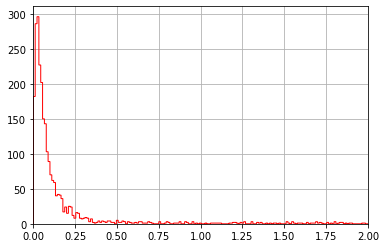

In [13]:
dRmatched = ak.flatten(gen.deltaR(genjet)[(abs(genjet.pt-gen.pt))<10], axis=None)

plt.hist(dRmatched,histtype='step', color='red',bins=800)
plt.grid(True)
plt.xlim([0, 2])
plt.show()

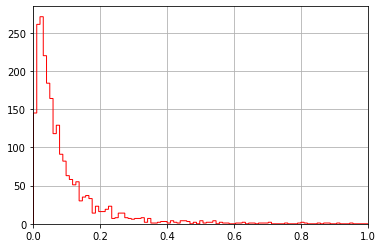

In [14]:
mindRgengenjet = ak.flatten(ak.min(gen.deltaR(genjet)[(abs(genjet.pt-gen.pt))<10],axis = -1), axis = None)
plt.hist(mindRgengenjet,histtype='step', color='red',bins=800)
plt.grid(True)
plt.xlim([0., 1.])
plt.show()

In [15]:
genjetmatchedpt = ak.flatten(genjet.pt[(gen.deltaR(genjet)<0.2) & ((abs(genjet.pt-gen.pt))<10)], axis=None)
genpt = ak.flatten(gen.pt, axis=None)
genmatchedpt = ak.flatten(gen.pt[(gen.deltaR(genjet)<0.2) & ((abs(genjet.pt-gen.pt))<10)], axis=None)

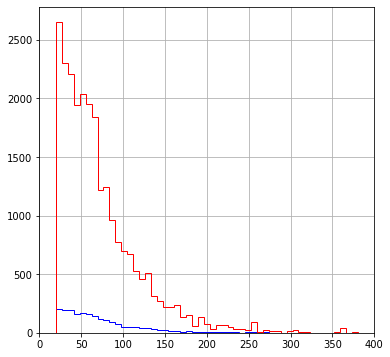

In [16]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.hist(genmatchedpt, color='blue',histtype='step',bins=80,label='reco-ak4jets')
ax.hist(genpt, color='r',histtype='step',bins=80,label='reco-ak4jets')
#ax.hist(genjetmatchedpt, color='orange', histtype='step',bins=80,label='gen-matched genjets')
#ax.legend('reco-ak4jet')
ax.grid(True)
plt.xlim([0, 400])
#plt.yscale('log')
plt.show()

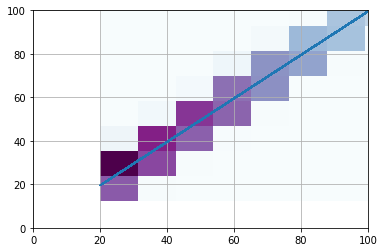

In [17]:
plt.hist2d(genmatchedpt,genjetmatchedpt, bins=(50, 50), cmap=plt.cm.BuPu)
m, b = np.polyfit(genmatchedpt, genjetmatchedpt, 1)
plt.plot(genmatchedpt, m*genmatchedpt + b)
plt.grid(True)
plt.xlim([0, 100])
plt.ylim([0, 100])
plt.show()

0.99060524
0.08262103


(None, None)

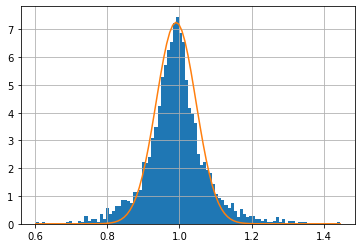

In [19]:
import scipy
from scipy import stats
data = genjetmatchedpt/genmatchedpt
_, bins, _ = plt.hist(data, 100, density=1, alpha=1.0)
mu, sigma = scipy.stats.norm.fit(data)

best_fit_line = scipy.stats.norm.pdf(bins, 0.99060524, 0.055)
plt.grid(True)
plt.plot(bins, best_fit_line)

print(mu), print(sigma)

In [20]:
genjetmatchedzip = ak.Array(genjet[(gen.deltaR(genjet)<0.2) & ((abs(genjet.pt-gen.pt))<10)])
print(genjetmatchedzip)

[[], [], [[{pt: 23.6, eta: 2.27, phi: -0.115, energy: 116}, ... [], [], [[]]]


In [21]:
genjetmatchedcandidate = ak.argmin(gen.deltaR(genjet)[(gen.deltaR(genjet)<0.2) & ((abs(genjet.pt-gen.pt))<10)], axis=-1, keepdims = True)
matched = gen_genjet[genjetmatchedcandidate]

In [22]:
genmatched, genjetmatchedzip = ak.unzip(matched)
genjetmatchedmain = ak.with_name(genjetmatchedzip, "Momentum3D")
print(genjetmatchedmain)

ak4jets = ak.with_name(ak4jet, "Momentum3D")
print(ak4jets)

reco_genjetmatched = ak.cartesian({"ak4jets": ak4jets, "genjetmatched": genjetmatchedmain}, nested=True)
ak4jet, genjetmatched = ak.unzip(reco_genjetmatched)
#print (ak4jet) 
#print(genjetmatched)

[[], [], [[{pt: 68.7, eta: -0.636, phi: -0.351, ... [], [], [[None]]]
[[{pt: 39.6, eta: -2.91, phi: 1.78}, {pt: 15, ... {pt: 6.55, eta: 2.94, phi: 2.03}]]


In [23]:
'''
ptdiffmin = ak.flatten(ak.min((ak4jet.pt-genjetmatched.pt), axis=-1), axis=None)
plt.hist(ptdiffmin,histtype='step', color='red',bins=100)
plt.grid(True)
plt.xlim([-200., 200.])
plt.show()
ptdiffmin2 = ak.to_numpy(ptdiffmin)
'''

"\nptdiffmin = ak.flatten(ak.min((ak4jet.pt-genjetmatched.pt), axis=-1), axis=None)\nplt.hist(ptdiffmin,histtype='step', color='red',bins=100)\nplt.grid(True)\nplt.xlim([-200., 200.])\nplt.show()\nptdiffmin2 = ak.to_numpy(ptdiffmin)\n"

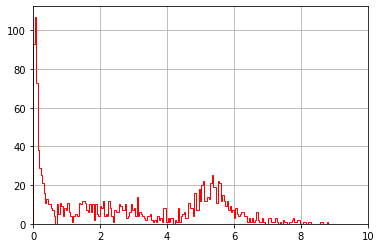

In [24]:
deltaRjetmatched = ak.flatten((ak4jet.deltaR(genjetmatched))[(abs(ak4jet.pt-genjetmatched.pt)<10)], axis=None)
plt.hist(deltaRjetmatched,histtype='step', color='red',bins=200)
plt.grid(True)
plt.xlim([0., 10.])
plt.show()

In [25]:
deltaRminjetmatched2 = ak.flatten(ak.min(ak4jet.deltaR(genjetmatched)[(abs(ak4jet.pt-genjetmatched.pt)<10)],axis=-1), axis=None)

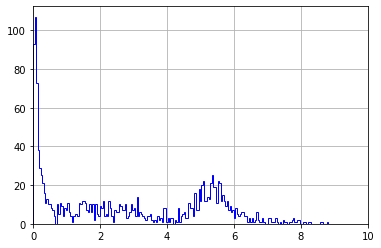

In [28]:
#plt.hist(deltaRminjetmatched,histtype='step', color='red',bins=200)
plt.hist(deltaRminjetmatched2,histtype='step', color='blue',bins=200)
plt.grid(True)
plt.xlim([0., 10.])
plt.show()

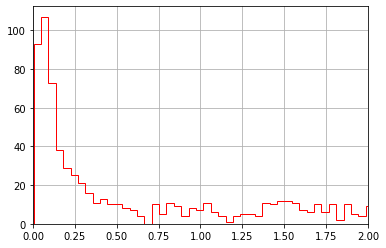

In [29]:
plt.hist(deltaRminjetmatched2,histtype='step', color='red',bins=200)
plt.grid(True)
plt.xlim([0., 2.])
plt.show()

In [32]:
deltaRjetmatched = ak.flatten((ak4jet.deltaR(genjetmatched))[(ak4jet.pt>6) & (genjetmatched.pt>30) & (abs(ak4jet.pt-genjetmatched.pt)<10)], axis=None)

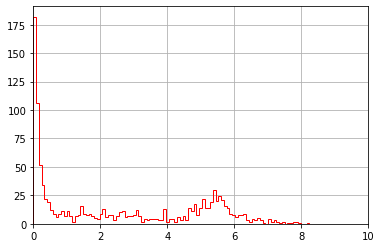

In [35]:
plt.hist(deltaRjetmatched,histtype='step', color='red',bins=100)
plt.grid(True)
plt.xlim([0., 10.])
plt.show()

In [36]:
jetmatched = ak.argmin(ak4jet.deltaR(genjetmatched)[(ak4jet.deltaR(genjetmatched)<0.2) & (ak4jet.pt>20) & (genjetmatched.pt>30) & abs((genjetmatched.eta>1.6)) & abs((genjetmatched.eta<2.7)) & (abs(ak4jet.pt-genjetmatched.pt)<10)], axis=-1,keepdims=False)
jetmatched
ak4jetmatched = ak4jet[jetmatched]
genjetmatchedfinal = genjetmatched[jetmatched]
print(genjetmatched)

[[], [[[], []], [[], []]], [[[{pt: 23.6, ... [[], []], [[], []]], [[[]]]]


In [ ]:
ak4jetr05 = ak4jet[(ak.min(ak4jet.deltaR(genjetmatched)<0.5,axis=None))]
genjetr05= genjetmatched[(ak.min(ak4jet.deltaR(genjetmatched)<0.5,axis=None))]

In [43]:
ak4jetr05

<MomentumArray3D [[], [[None, None], ... [[None]]] type='6120 * var * var * ?Mom...'>

In [44]:
genjetr05

<MomentumArray4D [[], [[None, None], ... [[None]]] type='6120 * var * var * opti...'>

In [45]:
ak4jetr05pt = ak.flatten((ak4jetr05.pt),axis=None)
ak4jetr05eta = ak.flatten((ak4jetr05.eta),axis=None)
ak4jetr05phi = ak.flatten((ak4jetr05.phi),axis=None)
print(ak4jetr05pt)
genjetr05pt = ak.flatten((genjetr05.pt),axis=None)
genjetr05eta = ak.flatten((genjetr05.eta),axis=None)
genjetr05phi = ak.flatten((genjetr05.phi),axis=None)

[33.6, 50.8, 61.7, 125, 56.7, 145, 101, ... 109, 38.9, 60.1, 102, 21.3, 61.5, 127]


/tmp/ipykernel_16137/879393372.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax0 = plt.subplots(1, 1, figsize=(12,12))


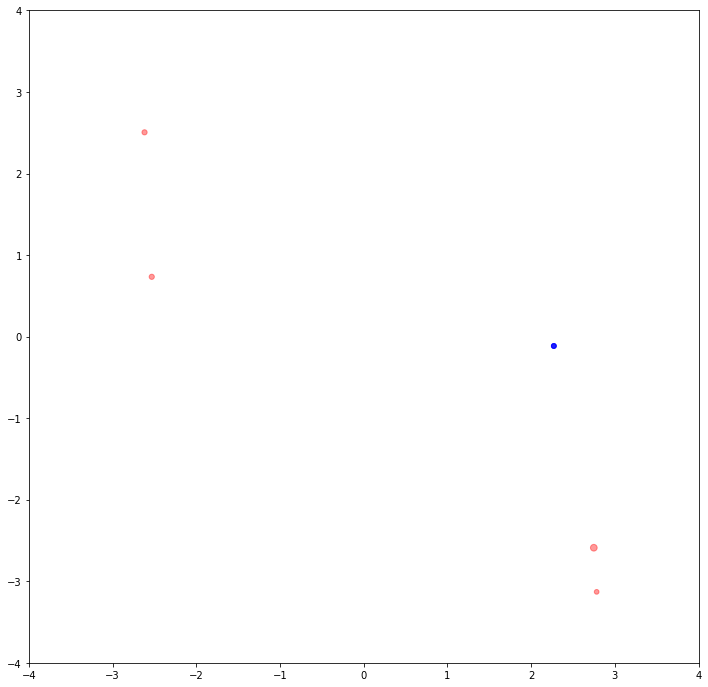

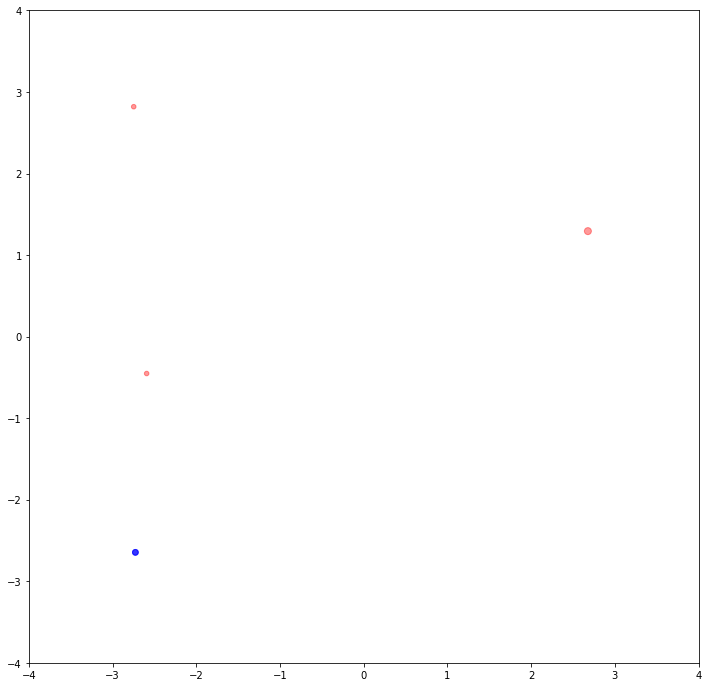

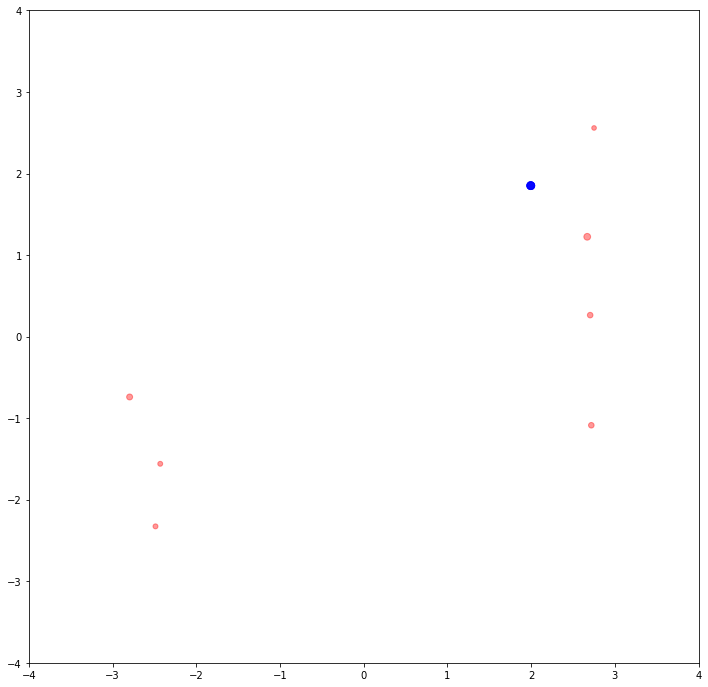

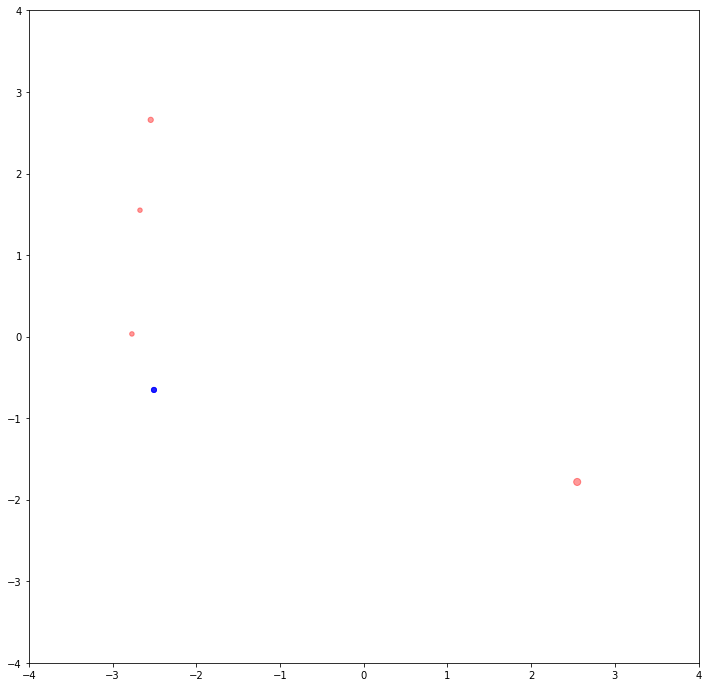

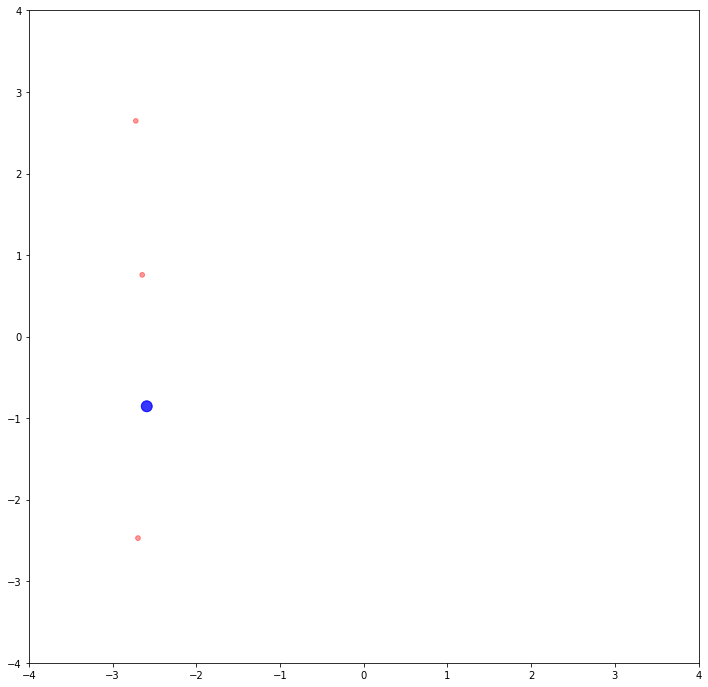

...

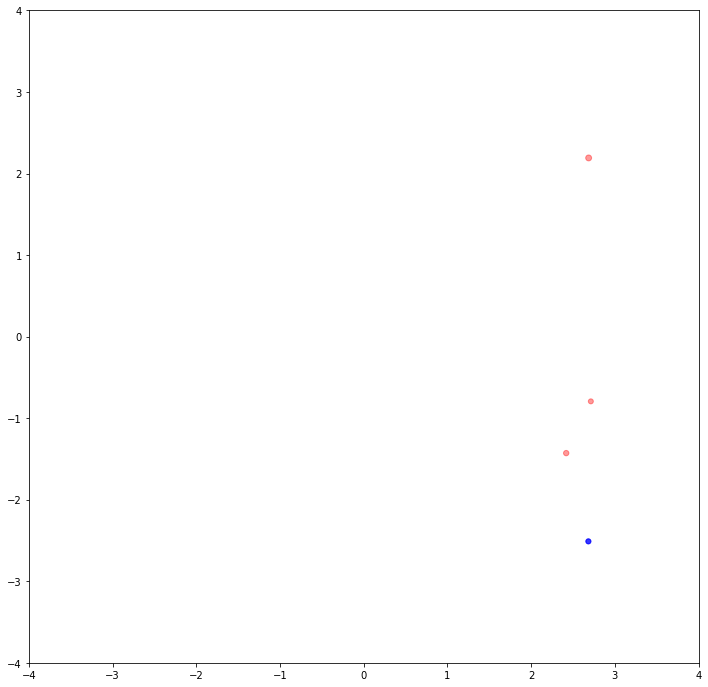

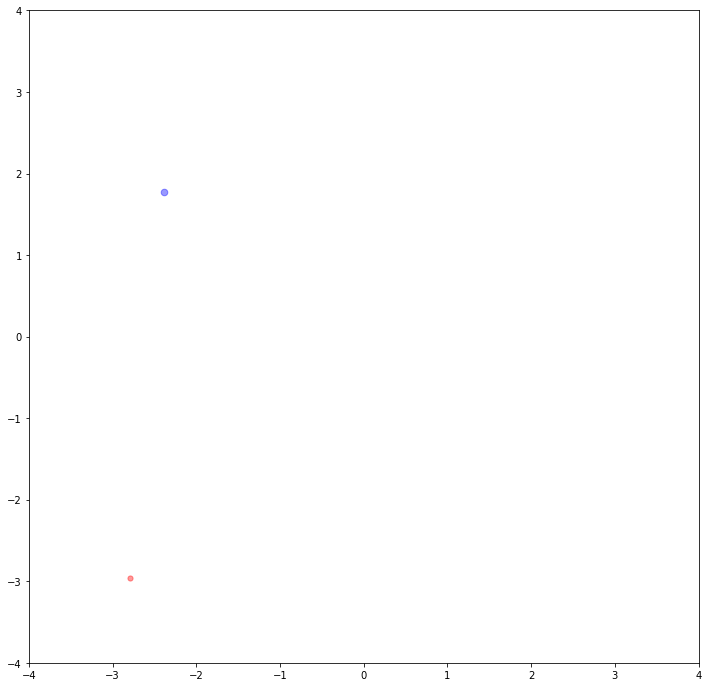

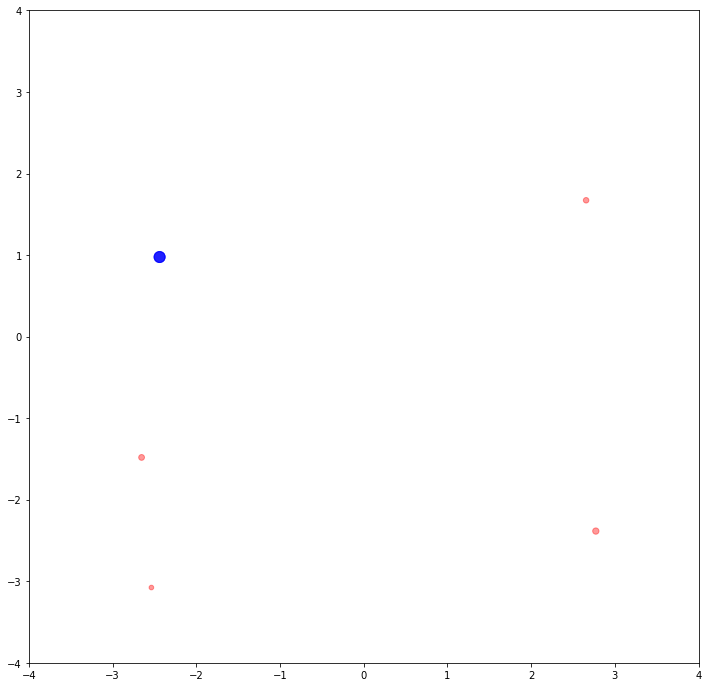

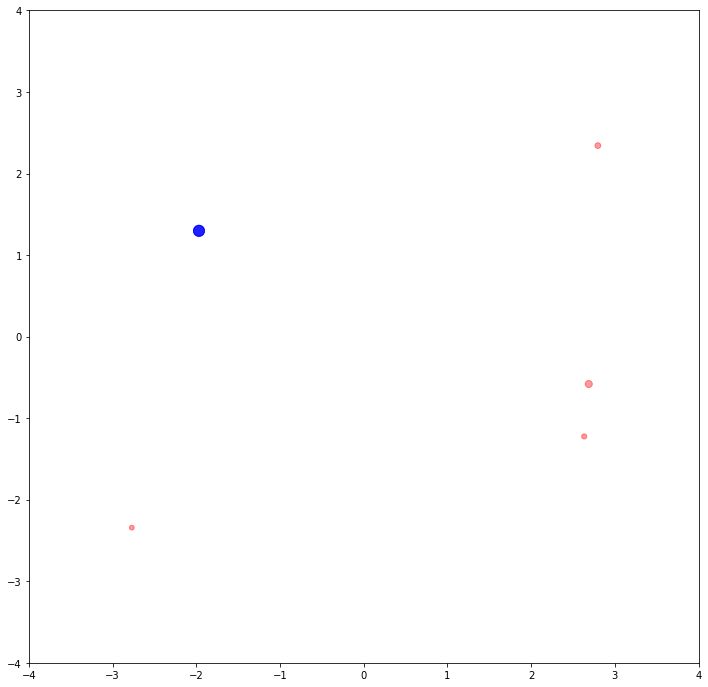

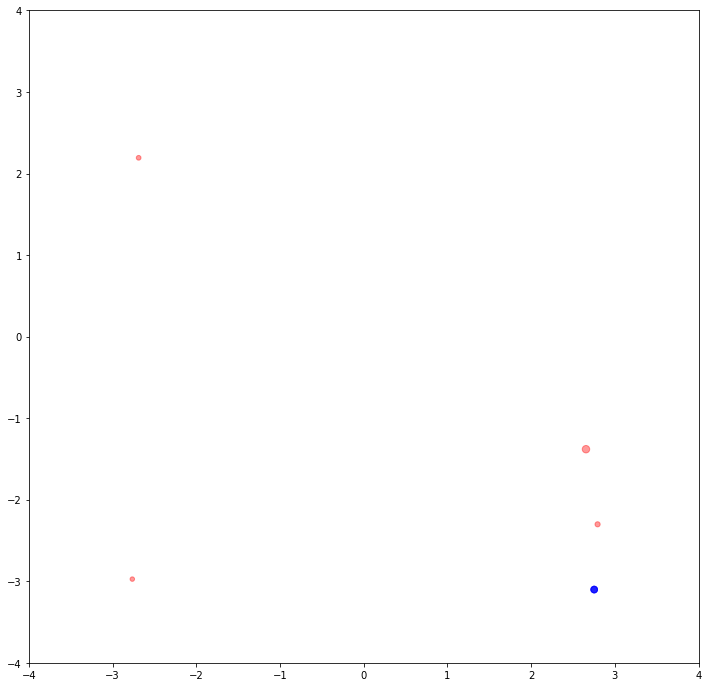

Error in callback <function flush_figures at 0x7f304c7ea790> (for post_execute):


KeyboardInterrupt: 

In [41]:
for i in range(len(genjetr05.pt)):
    if ak.any(genjetr05.pt[i]):
        ak4jetr05pt = ak4jetr05.pt[i]
        ak4jetr05eta = ak4jetr05.eta[i]
        ak4jetr05phi = ak4jetr05.phi[i]

        genjetr05pt = genjetr05.pt[i]
        genjetr05eta = genjetr05.eta[i]
        genjetr05phi = genjetr05.phi[i]
        

        ak4jetr05pt = ak.flatten((ak4jetr05pt),axis=None)
        ak4jetr05eta = ak.flatten((ak4jetr05eta),axis=None)
        ak4jetr05phi = ak.flatten((ak4jetr05phi),axis=None)
        genjetr05pt = ak.flatten((genjetr05pt),axis=None)
        genjetr05eta = ak.flatten((genjetr05eta),axis=None)
        genjetr05phi = ak.flatten((genjetr05phi),axis=None)
        
        fig, ax0 = plt.subplots(1, 1, figsize=(12,12))
        ax0.set_xlim(-4, 4)
        ax0.set_ylim(-4, 4)
        ax0.scatter(ak4jetr05eta,ak4jetr05phi,ak4jetr05pt,c='r',alpha=0.4)
        ax0.scatter(genjetr05eta,genjetr05phi,genjetr05pt,c='b',alpha=0.4)

/tmp/ipykernel_16137/879393372.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax0 = plt.subplots(1, 1, figsize=(12,12))


KeyboardInterrupt: 

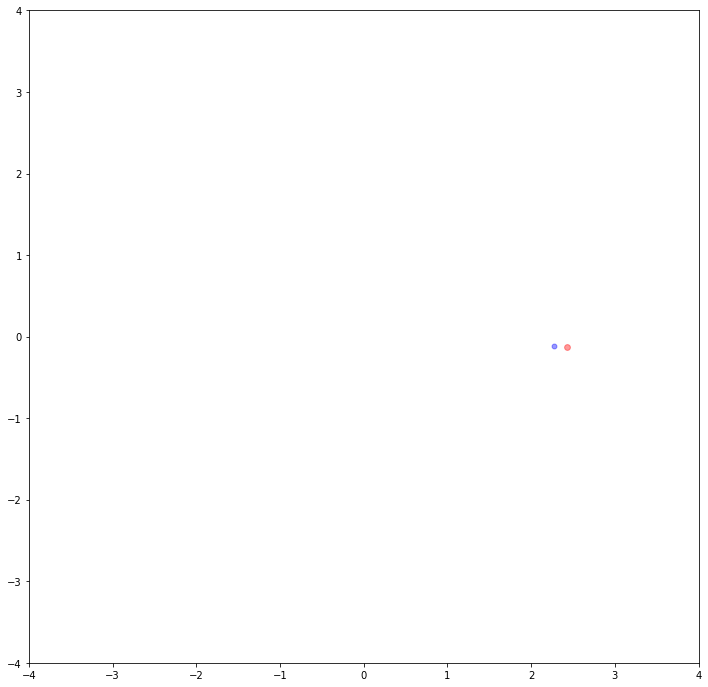

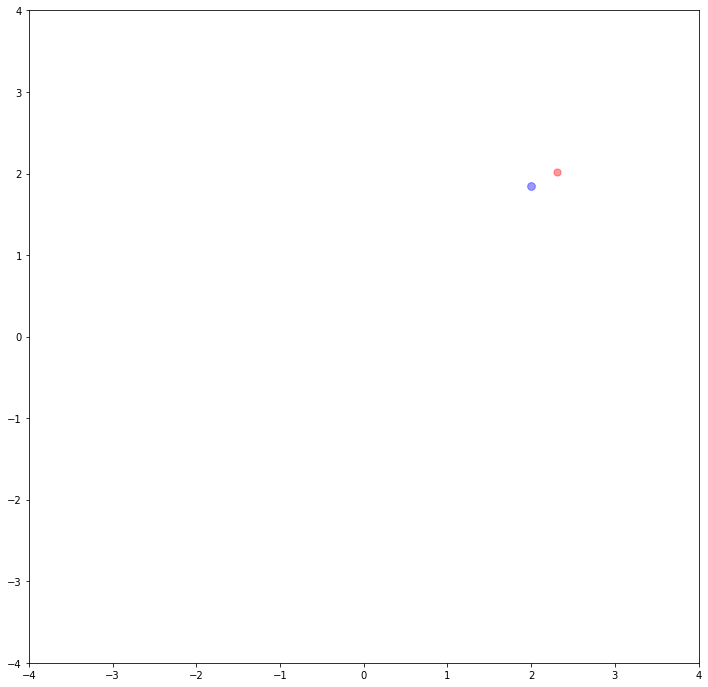

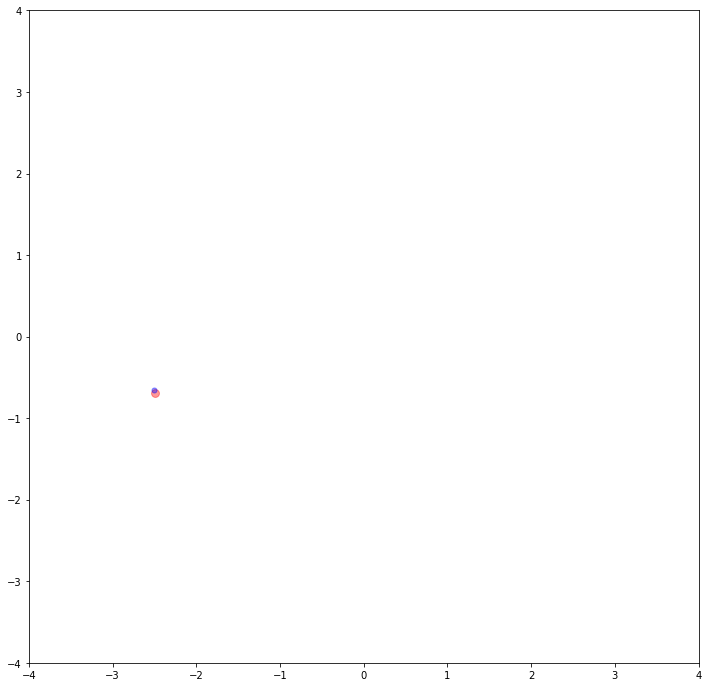

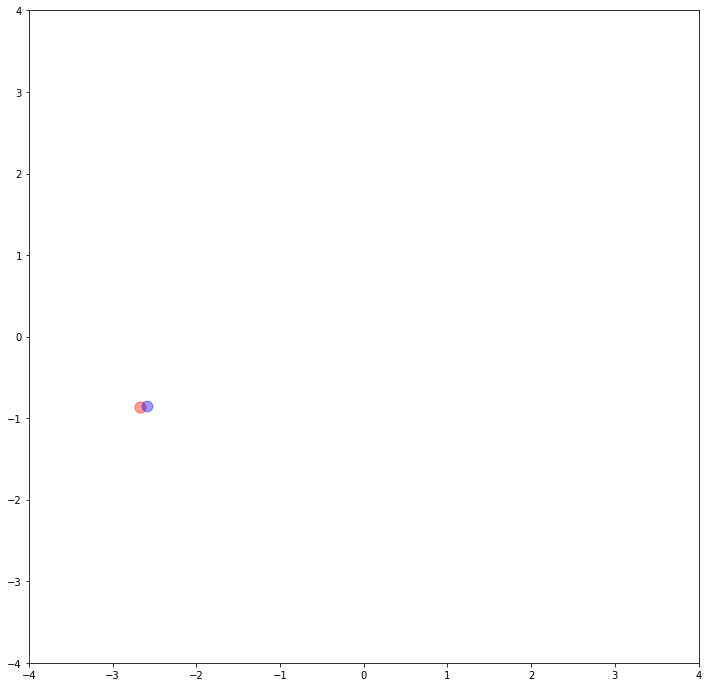

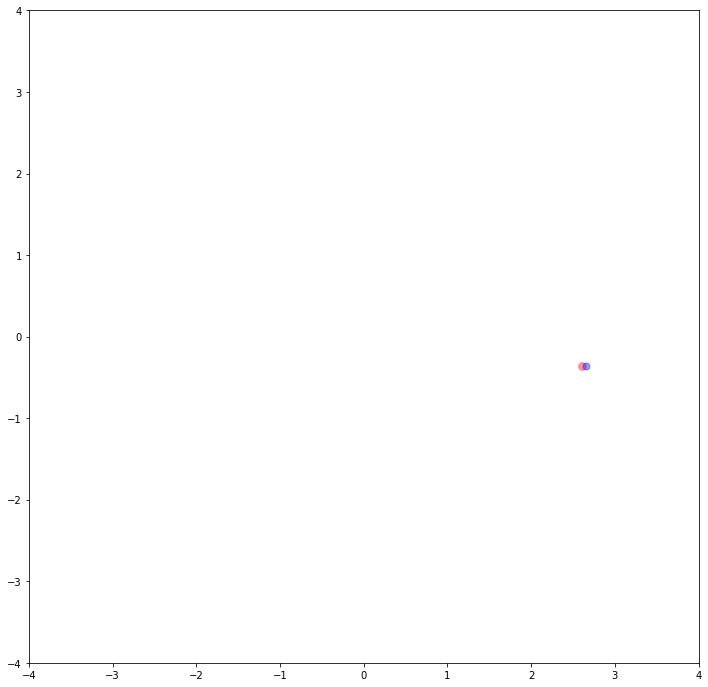

...

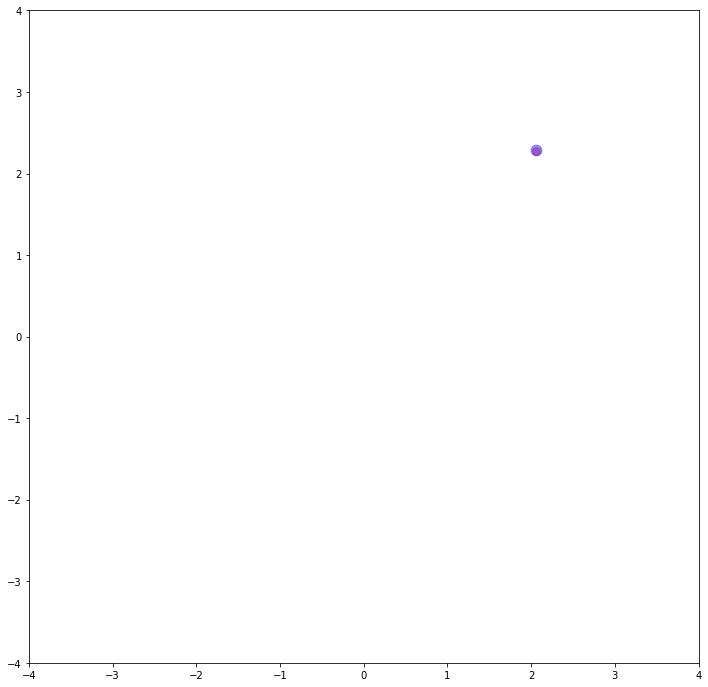

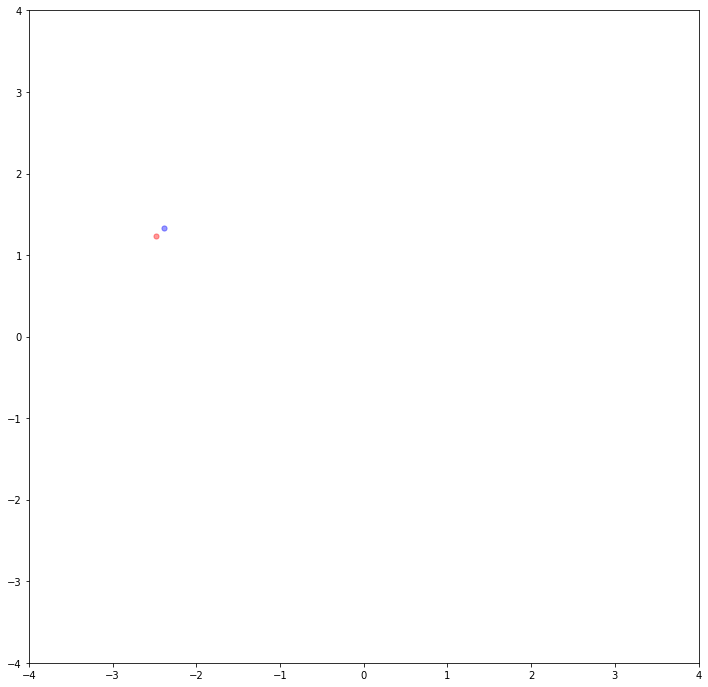

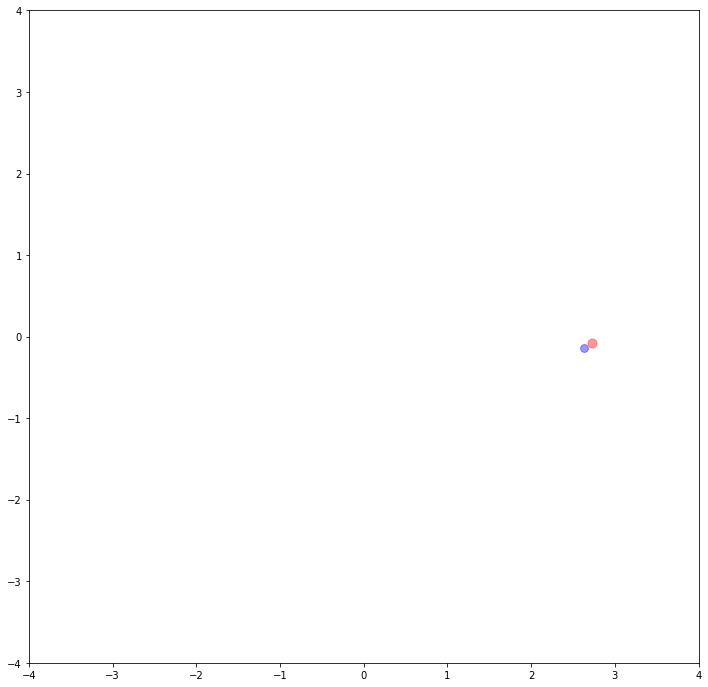

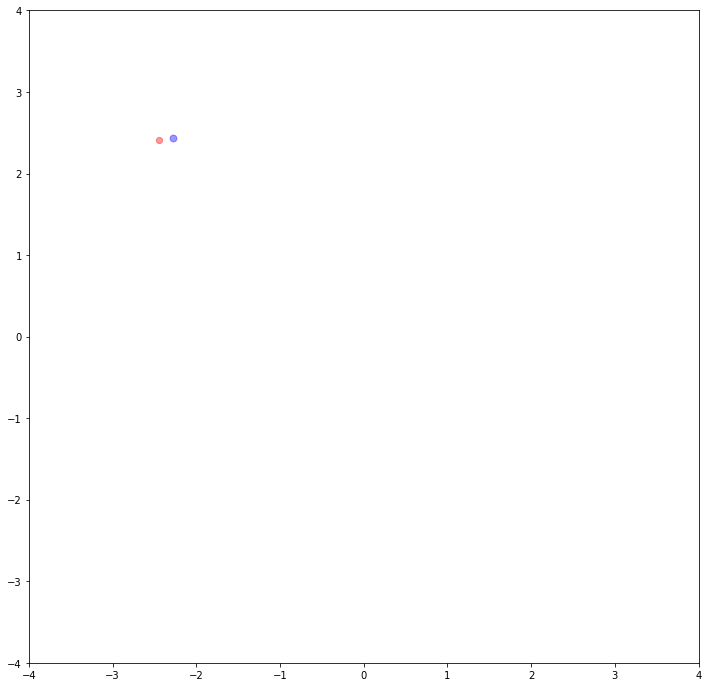

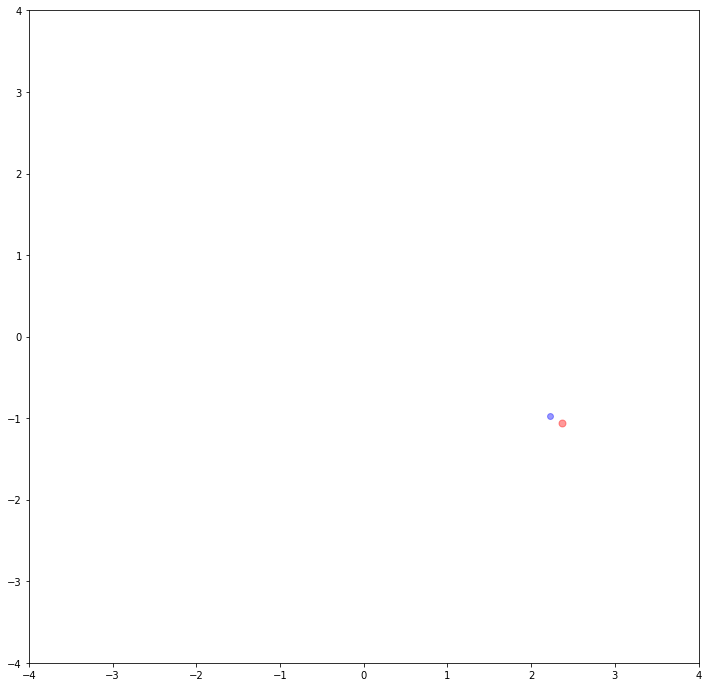

Error in callback <function flush_figures at 0x7f304c7ea790> (for post_execute):


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/llr/cms/sarkar/miniconda3/envs/myenv/lib/python3.8/site-packages/PIL/ImageFile.py", line 504, in _save
    fh = fp.fileno()
AttributeError: '_idat' object has no attribute 'fileno'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/llr/cms/sarkar/miniconda3/envs/myenv/lib/python3.8/site-packages/IPython/core/events.py", line 89, in trigger
    func(*args, **kwargs)
  File "/home/llr/cms/sarkar/miniconda3/envs/myenv/lib/python3.8/site-packages/matplotlib_inline/backend_inline.py", line 121, in flush_figures
    return show(True)
  File "/home/llr/cms/sarkar/miniconda3/envs/myenv/lib/python3.8/site-packages/matplotlib_inline/backend_inline.py", line 41, in show
    display(
  File "/home/llr/cms/sarkar/miniconda3/envs/myenv/lib/python3.8/site-packages/IPython/core/display.py", line 320, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  F

In [ ]:
for i in range(len(genjetr05.pt)):
    if ak.any(genjetr05.pt[i]):
        ak4jetr05pt = ak4jetr05.pt[i]
        ak4jetr05eta = ak4jetr05.eta[i]
        ak4jetr05phi = ak4jetr05.phi[i]

        genjetr05pt = genjetr05.pt[i]
        genjetr05eta = genjetr05.eta[i]
        genjetr05phi = genjetr05.phi[i]
        

        ak4jetr05pt = ak.flatten((ak4jetr05pt),axis=None)
        ak4jetr05eta = ak.flatten((ak4jetr05eta),axis=None)
        ak4jetr05phi = ak.flatten((ak4jetr05phi),axis=None)
        genjetr05pt = ak.flatten((genjetr05pt),axis=None)
        genjetr05eta = ak.flatten((genjetr05eta),axis=None)
        genjetr05phi = ak.flatten((genjetr05phi),axis=None)
        
        fig, ax0 = plt.subplots(1, 1, figsize=(12,12))
        ax0.set_xlim(-4, 4)
        ax0.set_ylim(-4, 4)
        ax0.scatter(ak4jetr05eta,ak4jetr05phi,ak4jetr05pt,c='r',alpha=0.4)
        ax0.scatter(genjetr05eta,genjetr05phi,genjetr05pt,c='b',alpha=0.4)

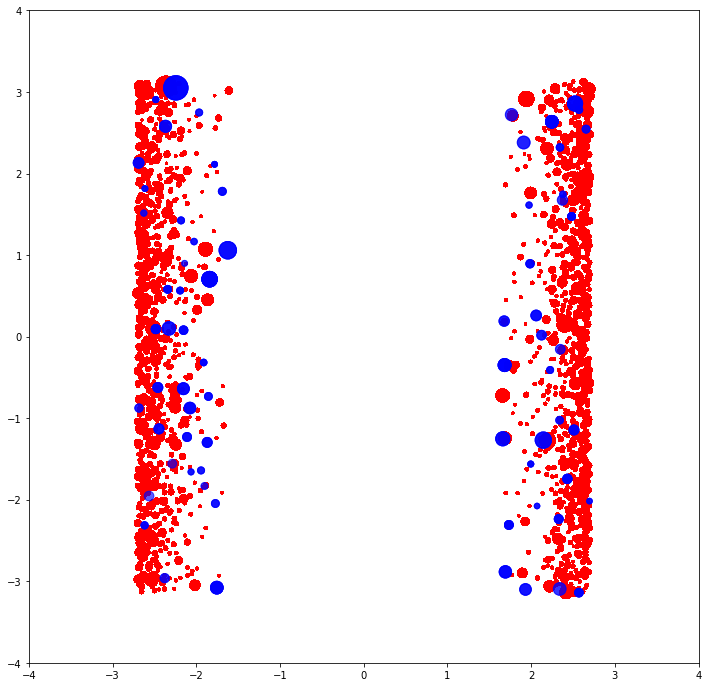

In [100]:
fig, ax0 = plt.subplots(1, 1, figsize=(12,12))
ax0.set_xlim(-4, 4)
ax0.set_ylim(-4, 4)
ax0.scatter(ak4jetr05eta,ak4jetr05phi,ak4jetr05pt,c='r',alpha=0.4)
ax0.scatter(genjetr05eta,genjetr05phi,genjetr05pt,c='b',alpha=0.4)


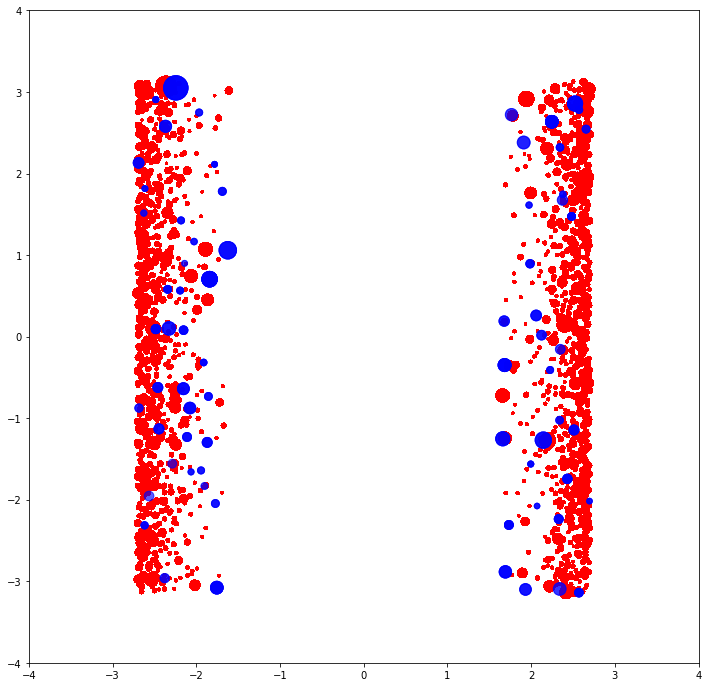

In [84]:
fig, ax0 = plt.subplots(1, 1, figsize=(12,12))
ax0.set_xlim(-4, 4)
ax0.set_ylim(-4, 4)
ax0.scatter(ak4jetr05eta,ak4jetr05phi,ak4jetr05pt,c='r',alpha=0.4)
ax0.scatter(genjetr05eta,genjetr05phi,genjetr05pt,c='b',alpha=0.4)


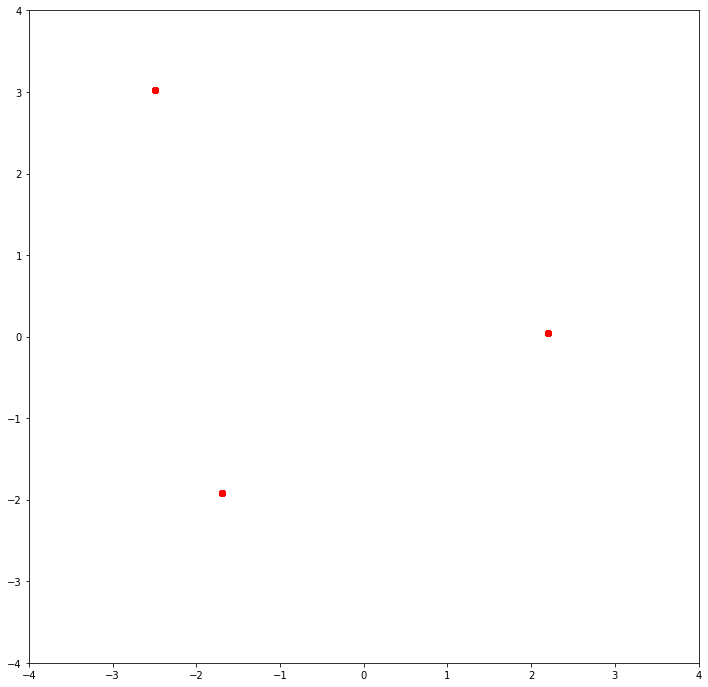

In [119]:
fig, ax0 = plt.subplots(1, 1, figsize=(12,12))
ax0.set_xlim(-4, 4)
ax0.set_ylim(-4, 4)
ax0.scatter(ak4jetr05eta,ak4jetr05phi,c='r',alpha=0.4)
ax0.scatter(genjetr05eta,genjetr05phi,c='b',alpha=0.4)


In [24]:
ak4jetmatchedpt = ak.flatten((ak4jetmatched.pt),axis=None)

In [25]:
ak4jet = ak.flatten((ak4jet.pt),axis=None)

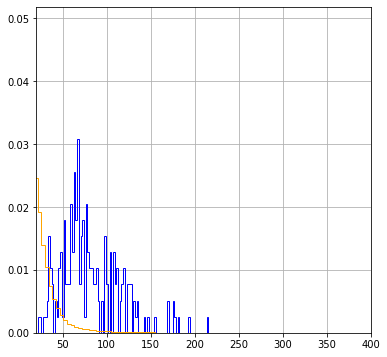

In [26]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.hist(ak4jetmatchedpt, color='blue',density=True,histtype='step',bins=100,label='reco-ak4jets')
ax.hist(ak4jet, color='orange', density=True, histtype='step',bins=100,label='gen-matched genjets')
#ax.legend('reco-ak4jet')
ax.grid(True)
plt.xlim([20, 400])
#plt.yscale('log')
plt.show()

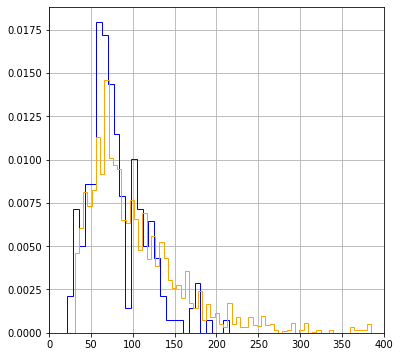

In [27]:
TURQUANT = ak.flatten((genjetmatched.pt),axis=None)
fig, ax = plt.subplots(figsize=(6, 6))
ax.hist(ak4jetmatchedpt, color='blue',density=True,histtype='step',bins=28,label='reco-ak4jets')
ax.hist(TURQUANT, color='orange', density=True, histtype='step',bins=110,label='gen-matched genjets')
#ax.legend('reco-ak4jet')
ax.grid(True)
plt.xlim([0, 400])
#plt.yscale('log')
plt.show()

In [28]:
l = ak4jetmatched.pt/genjetmatched.pt

In [29]:
l2 = ak4jetmatched.pt-genjetmatched.pt

In [30]:
l = ak.flatten(l, axis=None)
ln = ak.to_numpy(l)

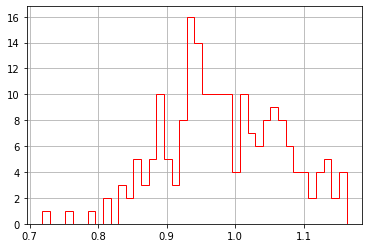

In [31]:
plt.hist(ln,histtype='step', color='red',bins=40)
plt.grid(True)
plt.show()

In [32]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
fulldf["ak4jet_c1"] = fulldf["ak4jet_eta"]
fulldf["ak4jet_pt_c1"] = fulldf["ak4jet_phi"]
fulldf["ak4jet_response_c1"] = fulldf["ak4jet_pt"]

In [33]:
input_c1 = fulldf.ak4jet_eta
ak4jetmatched_pt = ak.to_pandas(ak4jetmatched.pt)
genjetmatched_pt = ak.to_pandas(genjetmatchedfinal.pt)
#target_c1 = ak4jetmatched_pt-genjetmatched_pt
target_c1 = ak4jetmatched.pt-genjetmatched.pt
#print(input_c1)
#print(target_c1)

regressor = LinearRegression()

x_train, x_test, y_train, y_test = train_test_split(input_c1, target_c1, test_size= 0.2, random_state=0)

#x_train= x_train.reshape(-1, 1)
#y_train= y_train.reshape(-1, 1)
#x_test = x_test.reshape(-1, 1)

regressor.fit(x_train,y_train)

y_pred = regressor.predict(x_test)

#save_obj(C1model_dict[name], outFile_modelC1_dict[name])

fulldf['ak4jet_c1'] = y_pred
#fulldf['ak4jet_pt_c1'] = fulldf.ak4jet_c1 + fulldf.ak4jet_pt
#fulldf['ak4jet_response_c1'] = fulldf.ak4jet_pt_c1 / fulldf.genjet_pt


ValueError: setting an array element with a sequence.